# Анализ рынка заведений общественного питания

Заказчики – инвесторы из фонда «Shut Up and Take My Money».

**Цель проекта**

На основе данных сервисов Яндекс Карты и Яндекс Бизнес необходимо провести исследование рынка общественного питания Москвы, найти интересные особенности и закономерности.  Результаты исследования помогут инвесторам определиться с параметрами будущего заведения, такими как место, формат заведения, меню, ценообразование.

**План работы**
- загрузка и предобработка данных;
- анализ данных (посмотрим на количество объектов общественного питания по категориям и количество посадочных мест в местах по категориям; рассчитаем соотношение сетевых и несетевых заведений; составим топ сетевых заведений по их количеству в регионе; рассмотрим распределение заведений и их рейтингов по районам; составим топ улиц по количеству заведений; посмотрим на улицы с одним заведением; рассчитаем средние чеки по районам);
- детализаци исследования: открытие кофейни ( посчитаем количество кофеен; рассмотрим особенности их распложения; изучим круглосуточные кофейни; посмотрим распределение рейтингов кофеен по районам; рассчитаем среднюю стоимость чашки капучино);
- рекомендации по открытию нового заведения (формат,район, меню, ценообразование);
- презентация.

**Исходные данные**

Датасет moscow_places.csv с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, добавлена пользователями или найдена в общедоступных источниках, поэтому она носит исключительно справочный характер.

Файл moscow_places.csv:
- name — название заведения
- address — адрес заведения
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»
- hours — информация о днях и часах работы
- lat — широта географической точки, в которой находится заведение
- lng — долгота географической точки, в которой находится заведение
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: «Средний счёт: 1000–1500 ₽»; «Цена чашки капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽»
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений; eсли в строке указано одно число — цена без диапазона, то в столбец войдёт это число; eсли значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:eсли в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений; eсли в строке указано одно число — цена без диапазона, то в столбец войдёт это число; eсли значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): 0 — заведение не является сетевым, 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Обзор-и-предобработка-данных" data-toc-modified-id="Обзор-и-предобработка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Обзор и предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Общая-информация" data-toc-modified-id="Общая-информация-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Общая информация</a></span></li><li><span><a href="#Удаление-пропусков" data-toc-modified-id="Удаление-пропусков-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Удаление пропусков</a></span></li><li><span><a href="#Наличие-явных-и-неявных-дубликатов" data-toc-modified-id="Наличие-явных-и-неявных-дубликатов-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Наличие явных и неявных дубликатов</a></span></li><li><span><a href="#Обработка-аномальных-значений" data-toc-modified-id="Обработка-аномальных-значений-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Обработка аномальных значений</a></span></li><li><span><a href="#Добавление-новых-столбцов" data-toc-modified-id="Добавление-новых-столбцов-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Добавление новых столбцов</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span><ul class="toc-item"><li><span><a href="#Распределение-заведений-по-категориям" data-toc-modified-id="Распределение-заведений-по-категориям-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Распределение заведений по категориям</a></span></li><li><span><a href="#Распределение-посадочных-мест" data-toc-modified-id="Распределение-посадочных-мест-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Распределение посадочных мест</a></span></li><li><span><a href="#Отношение-сетевых-к-несетевым-заведениям" data-toc-modified-id="Отношение-сетевых-к-несетевым-заведениям-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Отношение сетевых к несетевым заведениям</a></span></li><li><span><a href="#Топ-15-сетевых-заведений" data-toc-modified-id="Топ-15-сетевых-заведений-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Топ-15 сетевых заведений</a></span></li><li><span><a href="#Распределение-заведений-по-районам" data-toc-modified-id="Распределение-заведений-по-районам-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Распределение заведений по районам</a></span></li><li><span><a href="#Распределение-средних-рейтингов-по-категориям-заведений" data-toc-modified-id="Распределение-средних-рейтингов-по-категориям-заведений-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Распределение средних рейтингов по категориям заведений</a></span></li><li><span><a href="#Картограмма-со-средним-рейтингом-заведений-каждого-района" data-toc-modified-id="Картограмма-со-средним-рейтингом-заведений-каждого-района-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Картограмма со средним рейтингом заведений каждого района</a></span></li><li><span><a href="#Отображение-заведений-на-карте" data-toc-modified-id="Отображение-заведений-на-карте-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Отображение заведений на карте</a></span></li><li><span><a href="#Топ-15-улиц-по-количеству-заведений" data-toc-modified-id="Топ-15-улиц-по-количеству-заведений-2.9"><span class="toc-item-num">2.9&nbsp;&nbsp;</span>Топ-15 улиц по количеству заведений</a></span></li><li><span><a href="#Улицы,-на-которых-находится-только-один-объект-общепита" data-toc-modified-id="Улицы,-на-которых-находится-только-один-объект-общепита-2.10"><span class="toc-item-num">2.10&nbsp;&nbsp;</span>Улицы, на которых находится только один объект общепита</a></span></li><li><span><a href="#Картограмма-со-средним-чеком-в-заведениях-различных-районов" data-toc-modified-id="Картограмма-со-средним-чеком-в-заведениях-различных-районов-2.11"><span class="toc-item-num">2.11&nbsp;&nbsp;</span>Картограмма со средним чеком в заведениях различных районов</a></span></li></ul></li><li><span><a href="#Детализация-исследования:-открытие-кофейни" data-toc-modified-id="Детализация-исследования:-открытие-кофейни-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Детализация исследования: открытие кофейни</a></span><ul class="toc-item"><li><span><a href="#Распределение-кофеен-по-районам" data-toc-modified-id="Распределение-кофеен-по-районам-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Распределение кофеен по районам</a></span></li><li><span><a href="#Круглосуточные-кофейни" data-toc-modified-id="Круглосуточные-кофейни-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Круглосуточные кофейни</a></span></li><li><span><a href="#Средние-рейтинги-кофеен-по-районам" data-toc-modified-id="Средние-рейтинги-кофеен-по-районам-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Средние рейтинги кофеен по районам</a></span></li><li><span><a href="#Стоимость-чашки-капучино" data-toc-modified-id="Стоимость-чашки-капучино-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Стоимость чашки капучино</a></span></li></ul></li><li><span><a href="#Рекомендации-по-открытию-нового-заведения" data-toc-modified-id="Рекомендации-по-открытию-нового-заведения-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Рекомендации по открытию нового заведения</a></span></li></ul></div>

## Обзор и предобработка данных

### Общая информация

In [1]:
# импортируем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import scipy.stats as stats

In [2]:
# снимаем ограничение на количество столбцов
pd.options.display.max_rows = 20

In [3]:
# открываем файл
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [4]:
# смотрим основную информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data_shape = data.shape[0]

In [6]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


В датасете представлена информация о 8406 заведениях Москвы, где:
- name — название заведения
- address — адрес заведения
- category — категория заведения
- hours — информация о днях и часах работы
- lat — широта географической точки, в которой находится заведение
- lng — долгота географической точки, в которой находится заведение
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и т.д.
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым
- district — административный район, в котором находится заведение
- seats — количество посадочных мест

### Удаление пропусков

In [7]:
# количество пропусков
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [8]:
# процент пропусков
round(data.isna().sum()/len(data)*100)

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.0
lat                   0.0
lng                   0.0
rating                0.0
price                61.0
avg_bill             55.0
middle_avg_bill      63.0
middle_coffee_cup    94.0
chain                 0.0
seats                43.0
dtype: float64

In [9]:
# check
# пропущенные значения бары

def pass_value_barh(dfg):
    try:
        (
            (dfg.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = -5, legend = False, fontsize = 16)
            .set_title('Пример' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

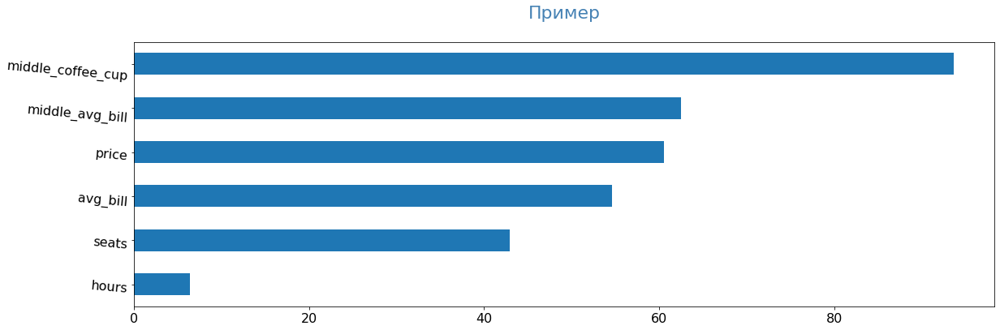

In [10]:
pass_value_barh(data)

Присутствует небольшое количество пропусков в столбце с временем работы(hours), обработать пропуски нельзя, поэтому оставим их как есть.

Больше половины данных потеряно в столбцах с категорией цен(price), диапазоном средней стоимости заказа(avg_bill), количеством посадочных мест seats, природа пропусков неясна, поэтому оставим их как есть. Значения в столбцах middle_avg_bill, middle_coffee_cup зависят от avg_bill, посмотрим присутствуют ли пропуски, которые можно обработать.

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений;
- если в строке указано одно число — цена без диапазона, то в столбец войдёт это число;
- если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт. Сделаем срез строк, у которых есть значения в столбце avg_bill, начинающихся с подстроки «Средний счёт», и при этом пропуск в столбце middle_avg_bill.

In [11]:
# делаем срез для строк с пропусками в middle_avg_bill, которые можно обработать
data [(data['avg_bill'].isna()==False)&
      (data['avg_bill'].str.contains(r'\Средний счёт'))&
      (data['middle_avg_bill'].isna()==True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений;
- если в строке указано одно число — цена без диапазона, то в столбец войдёт это число;
- если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
Сделаем срез строк, у которых есть значения в столбце avg_bill, начинающихся с подстроки «Цена одной чашки капучино», и при этом пропуск в столбце middle_coffee_cup

In [12]:
# делаем срез для строк с пропусками в middle_coffee_cup, которые можно обработать
data [(data['avg_bill'].isna()==False)&
      (data['avg_bill'].str.contains(r'\Цена одной чашки капучино'))&
      (data['middle_coffee_cup'].isna()==True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Пропуски, которые можно обработать, в столбцах middle_avg_bill и middle_coffee_cup отсутсвуют.

### Наличие явных и неявных дубликатов

In [13]:
# количество неявных дубликатов
data.duplicated().sum()

0

In [14]:
# приведем названия заведений к нижнему регистру
data['name'] = data['name'].str.lower()

In [15]:
# проверим дубликаты по месту и названию
data[data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [16]:
# удалим дубликаты
data[['name', 'address']] = data[['name', 'address']].drop_duplicates()

In [17]:
# посмотрим на уникальные названия категорий
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [18]:
# посмотрим на уникальные названия районов 
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

### Обработка аномальных значений

In [19]:
# посмотрим на распределение значений
data[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe()

,rating,middle_avg_bill,middle_coffee_cup,seats
count,8406.000000,3149.000000,535.000000,4795.000000
mean,4.229895,958.053668,174.721495,108.421689
std,0.470348,1009.732845,88.951103,122.833396
min,1.000000,0.000000,60.000000,0.000000
25%,4.100000,375.000000,124.500000,40.000000
50%,4.300000,750.000000,169.000000,75.000000
75%,4.400000,1250.000000,225.000000,140.000000
max,5.000000,35000.000000,1568.000000,1288.000000


Минимальный средний чек равен 0, а максимальный 35000, 1568 рублей за чашку кофе, похоже на ошибки в данных. Количество посадочных мест в 0 похоже на еду на вынос, а вот 1288 на очень большой банкетный зал или ошибку.

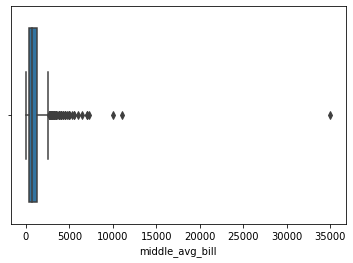

In [20]:
# построим ящик с усами для среднего счета
sns.boxplot(x=data['middle_avg_bill'])
sns.set_palette('Set2')

In [21]:
# удалим строку со средним чеком равным 0 и чеком больше 2500
data = data.drop(data[data ['middle_avg_bill'] == 0].index)
data = data.drop(data[data['middle_avg_bill'] > 2500].index)

In [22]:
# удалили 1% данных
(data_shape - data.shape[0])/data_shape

0.012491077801570306

<AxesSubplot:xlabel='middle_coffee_cup'>

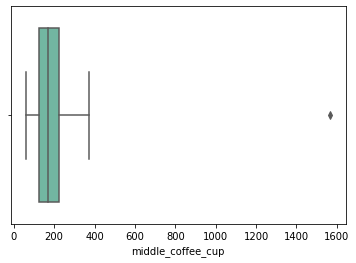

In [23]:
# построим ящик с усами для средней цены за чашку кофе
sns.boxplot(x=data['middle_coffee_cup'])

In [24]:
#посмотрим в каком заведении кофе стоит почти 1600
data[data['middle_coffee_cup'] > 1500]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


In [25]:
# исправим ошибку
data.at[2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.at[2859, 'middle_coffee_cup'] = 260

<AxesSubplot:xlabel='seats'>

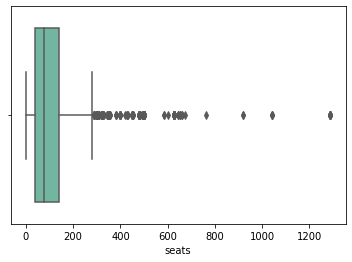

In [26]:
# построим ящик с усами для количества посадочных мест
sns.boxplot(x = data['seats'])

In [27]:
data[data['seats'] > 300][['name', 'category', 'address', 'seats', 'chain']]

,name,category,address,seats,chain
127,арарат,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",350.0,1
171,one price coffee,кофейня,"Москва, Дмитровское шоссе, 163А, корп. 1",350.0,1
176,вуди пицца,пиццерия,"Москва, Дмитровское шоссе, 107А, корп. 1",350.0,0
194,ленкорань,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",350.0,0
216,грузинский бульвар,быстрое питание,"Москва, Дмитровское шоссе, 163А, корп. 1",350.0,0
...,...,...,...,...,...
8171,монстер хиллс,ресторан,"Москва, Автозаводская улица, 18",455.0,0
8198,милти,быстрое питание,"Москва, улица Ленинская Слобода, 19",450.0,0
8237,pasta cup & pinsa,пиццерия,"Москва, Автозаводская улица, 18",455.0,0
8315,чайхана бишкек,ресторан,"Москва, Тихорецкий бульвар, 2, корп. 1",305.0,0


Удалять выбросы пока не будем, чтобы не терять большое количество данных.

### Добавление новых столбцов

In [28]:
# создаем столбец с названиями улиц
data['street'] = data['address'].str.split(', ').str[1]

In [29]:
# создаем столбец с логическим значением True для заведений работающих ежедневно и круглосуточно
data['is_24_7'] = data['hours'].str.contains(r'\ежедневно, круглосуточно')

**Выводы по разделу**
- В данных присутсвтуют пропуски, которые невозможно обработать или удалить, поэтому они были оставлены
- В результате предобработки были удалены дубликаты в данных
- Построены ящики с усами для среднего счета, средней цены за чашку кофе и количества посадочных мест
- Добавили столбцы с названием улиц и обозначением заведений, работающих 24/7

In [30]:
# check
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8301 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8298 non-null   object 
 1   category           8301 non-null   object 
 2   address            8298 non-null   object 
 3   district           8301 non-null   object 
 4   hours              7765 non-null   object 
 5   lat                8301 non-null   float64
 6   lng                8301 non-null   float64
 7   rating             8301 non-null   float64
 8   price              3213 non-null   object 
 9   avg_bill           3711 non-null   object 
 10  middle_avg_bill    3044 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8301 non-null   int64  
 13  seats              4724 non-null   float64
 14  street             8298 non-null   object 
 15  is_24_7            7765 non-null   object 
dtypes: float64(6), int64(1),

## Анализ данных

### Распределение заведений по категориям

In [31]:
category = (
    data.groupby('category')
    .agg(count = ('name', 'count'))
    .reset_index()
    .sort_values(by = 'count', ascending = False)
)
category['percent'] = category['count']/(category['count'].sum())*100
category

,category,count,percent
3,кафе,2372,28.585201
6,ресторан,1963,23.656303
4,кофейня,1412,17.016148
0,"бар,паб",752,9.062425
5,пиццерия,629,7.580140
2,быстрое питание,600,7.230658
7,столовая,314,3.784044
1,булочная,256,3.085081


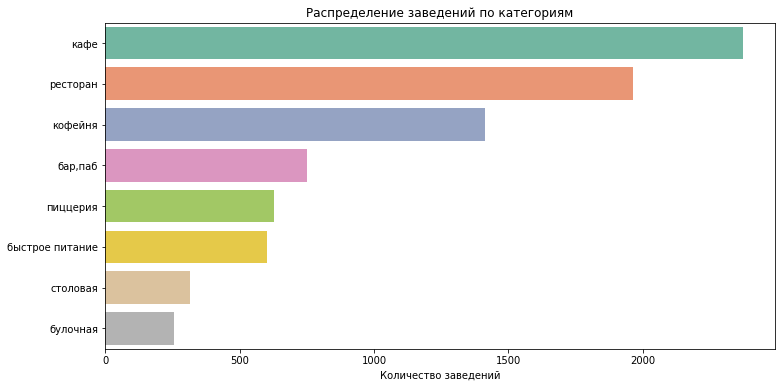

In [32]:
plt.figure(figsize = (12,6))
ax = sns.barplot(x = 'count', y = 'category', data = category)
ax.set_title('Распределение заведений по категориям')
ax.set_xlabel('Количество заведений') 
ax.set_ylabel('')
plt.show()

Больше всего в Москве кафе(28.2%) и ресторанов(24.3%), чуть меньше кофеен(16.8%). Далее следуют бары(9.1%), пиццерии(7.5%) и заведения быстрого питания(7.2%). Меньше всего столовых(3.8%) и булочных(3.1%).

### Распределение посадочных мест

In [33]:
seats = (
    data.groupby('category')
    .agg(count = ('seats', 'median'))
    .reset_index()
    .sort_values(by = 'count',  ascending = False)
)
seats

,category,count
6,ресторан,85.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


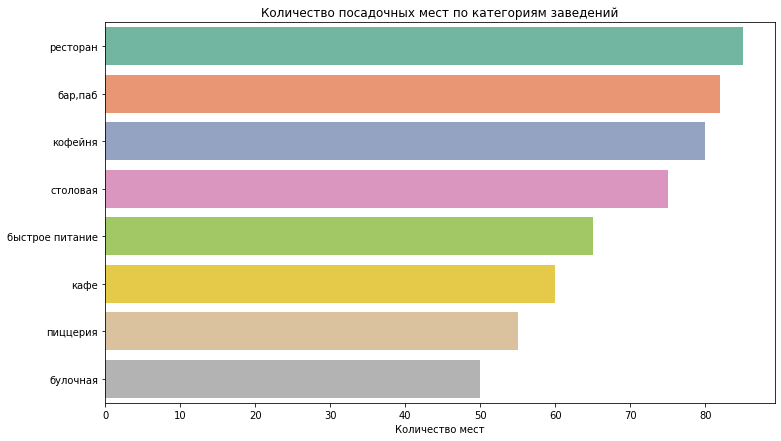

In [34]:
plt.figure(figsize = (12,7))
ax = sns.barplot(y = 'category',
                 x = 'count',
                 data = seats,
                 orient = 'h',
                 estimator = np.median)
ax.set_title('Количество посадочных мест по категориям заведений')
ax.set_xlabel('Количество мест') 
ax.set_ylabel('')
plt.show()

В ресторанах, барах и кофейнях в среднем мест больше, обычно в этих заведениях люди проводят больше времени, общаются между собой и отдыхают. Далее идут столовые, заведения быстрого питания и кафе, эти заведения предполагают быстрый перекус. Меньше всего мест в пиццериях и булочных, часть посетителей берет еду на вынос или пользуется доставкой. 

### Отношение сетевых к несетевым заведениям

In [35]:
# создадим переменные с количеством сетевых и несетевых заведений
chain_true = data[data['chain']==1]['name'].count()
chain_false = data[data['chain']==0]['name'].count()
display(f'Сетевых заведений {chain_true}, несетевых {chain_false}')

'Сетевых заведений 3193, несетевых 5105'

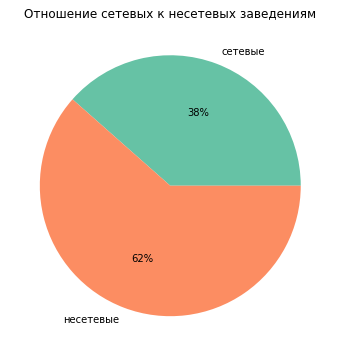

In [36]:
plt.figure(figsize = (6,6))
plt.pie([chain_true, chain_false], labels = ['сетевые', 'несетевые'], autopct='%.0f%%')
plt.title('Отношение сетевых к несетевых заведениям')
plt.show()

В Москве преобладают несетевые заведения(62% против 38%), возможно в них входят локальные сети из нескольких заведений. Рассмотрим отношение сетевых к несетевых в разреве категорий заведений.

In [37]:
# создаем сводную таблицу
chain_category = (
    data.groupby('category')
    .agg({'chain':'sum', 'name':'count'})
    .reset_index()
)
chain_category.columns = ['category', 'chain_count', 'total_count']
chain_category['percent'] = chain_category['chain_count']/chain_category['total_count']*100
chain_category = chain_category.sort_values(by = 'percent', ascending = False)
chain_category

,category,chain_count,total_count,percent
1,булочная,157,256,61.328125
5,пиццерия,329,629,52.305246
4,кофейня,719,1412,50.920680
2,быстрое питание,230,600,38.333333
6,ресторан,725,1963,36.933265
3,кафе,779,2372,32.841484
7,столовая,88,314,28.025478
0,"бар,паб",168,752,22.340426


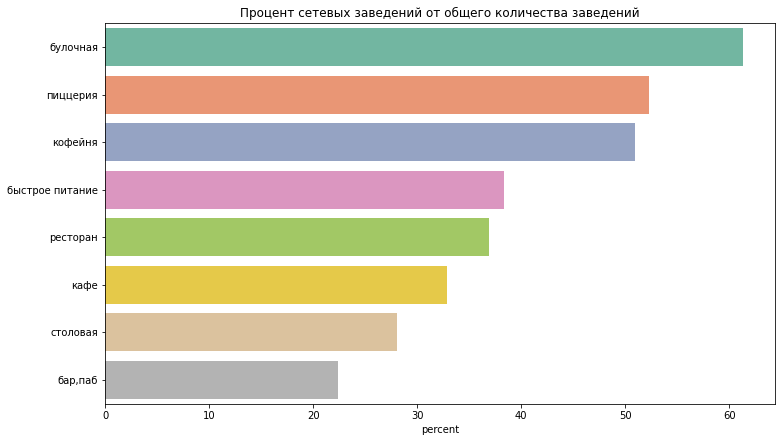

In [38]:
plt.figure(figsize = (12,7))
ax = sns.barplot(data = chain_category, x = 'percent', y = 'category')
plt.title('Процент сетевых заведений от общего количества заведений')
ax.set_ylabel('')
ax.set_ylabel('')
plt.show()

Для булочных количество сетевых заведений преобладает над несетевыми. Примерно поровну сетевых и несетевых заведений в категориях пиццерия и кофейня. Для остальных категорий преобладает количество несетевых заведений, самый маленький процент у баров.

### Топ-15 сетевых заведений 

In [41]:
# группируем данные, чтобы найти топ-15 сетевых заведений
data_chain = data[data['chain']==1]
top_chain = (
    data_chain
    .groupby('name')
    .agg({'address':'count', 'category':'first', 'price': 'first'})
    .reset_index()
    .sort_values(by = 'address', ascending = False)
    .head(15)
)
top_chain.columns = ['name', 'count', 'category', 'price']
top_chain

,name,count,category,price
729,шоколадница,120,кофейня,средние
335,домино'с пицца,76,пиццерия,средние
331,додо пицца,74,пиццерия,средние
146,one price coffee,71,кофейня,средние
742,яндекс лавка,69,ресторан,None
58,cofix,65,кофейня,средние
168,prime,50,ресторан,низкие
664,хинкальная,44,быстрое питание,средние
409,кофепорт,42,кофейня,низкие
418,кулинарная лавка братьев караваевых,39,кафе,средние


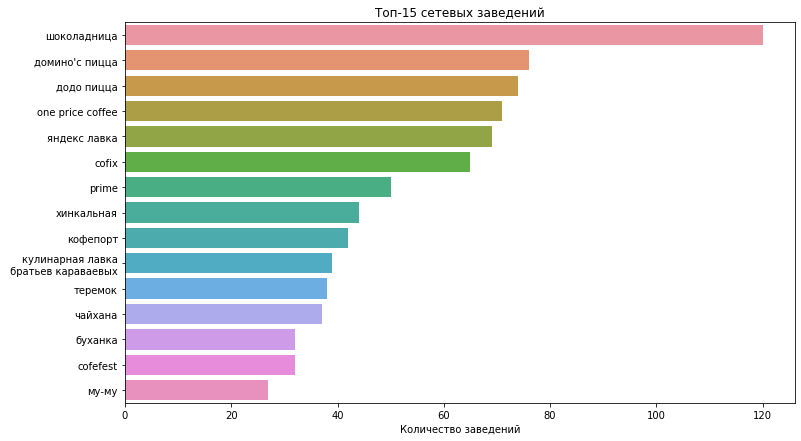

In [42]:
top_chain['name'] = top_chain['name'].replace('кулинарная лавка братьев караваевых',
                                             'кулинарная лавка\n братьев караваевых')

plt.figure(figsize = (12,7))
ax = sns.barplot(y = 'name', x = 'count', data = top_chain, orient = 'h')
ax.set_title('Топ-15 сетевых заведений')
ax.set_xlabel('Количество заведений') 
ax.set_ylabel('')
plt.show()

In [43]:
top_chain_category = (top_chain
                      .groupby('category')
                      .agg(count = ('count','sum'))
                      .reset_index()
                      .sort_values(by='count')
)
top_chain_category['percent'] = top_chain_category['count']/(top_chain_category['count'].sum())
top_chain_category

,category,count,percent
0,булочная,32,0.039216
1,быстрое питание,44,0.053922
2,кафе,103,0.126225
4,пиццерия,150,0.183824
5,ресторан,157,0.192402
3,кофейня,330,0.404412


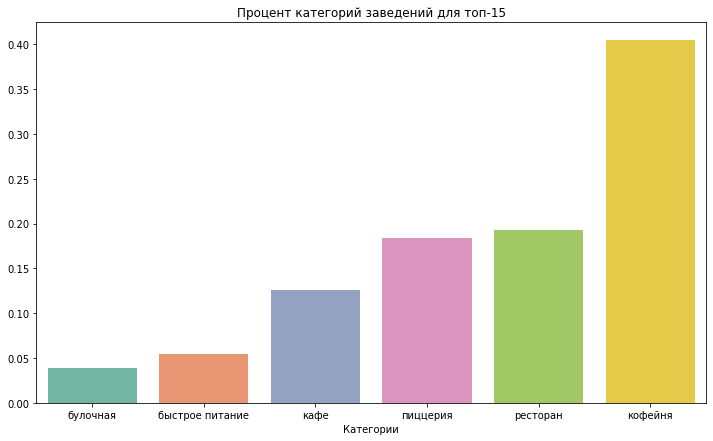

In [44]:
plt.figure(figsize = (12,7))
ax = sns.barplot(y = 'percent', x = 'category', data = top_chain_category, orient = 'v')
ax.set_title('Процент категорий заведений для топ-15')
ax.set_xlabel('Категории') 
ax.set_ylabel('')
plt.show()

В топ-15 заведений Москвы преобладают кофейни,далее идут кафе, рестораны и пиццерии, одна сеть быстрого питания и булочная. В топе сетей отсутствуют бары и столовыe. Цены в топ-15 сетевых заведений в среднем ценовом диапазоне.

###  Распределение заведений по районам

In [47]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [48]:
# построим сводную таблицу
district_category = data.pivot_table (
    index = 'district',
    columns = 'category',
    values = 'address',
    aggfunc = 'count'
)
district_category['total'] = district_category[['бар,паб', 'булочная', 'быстрое питание','кафе',
                                                'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
district_category = district_category.sort_values(by = 'total', ascending = False)
district_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,354,50,86,464,427,112,621,66,2180
Северный административный округ,66,39,58,234,193,77,182,41,890
Южный административный округ,68,25,85,264,131,73,198,44,888
Северо-Восточный административный округ,62,28,82,268,159,68,178,40,885
Западный административный округ,50,37,62,238,150,69,208,23,837
Восточный административный округ,53,25,70,272,105,72,158,40,795
Юго-Восточный административный округ,38,13,66,280,89,55,143,25,709
Юго-Западный административный округ,38,27,61,238,96,63,167,17,707
Северо-Западный административный округ,23,12,30,114,62,40,108,18,407


In [49]:
# удаляем столбец с общим количеством заведений по районам
district_category = district_category.drop (columns = ['total'], axis = 1)

In [50]:
fig = px.bar(district_category, color = 'category', title = 'Количество заведений каждой категории по районам',
            orientation='h')
fig.update_layout(
    title_x = 0.5,
    xaxis_title="Количество заведений",
    yaxis_title="",
    margin=dict(l=0, r=0, t=30, b=0))
fig.show()

Больше всего заведений в Центральном административном округе(2241), в районе преобладают рестораны, кофейни, кафе и бары. Меньше всего заведений в Северо-Западном административном округе(409), в остальных округах количество заведений находится в диапазоне от 709 до 898.

### Распределение средних рейтингов по категориям заведений

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [51]:
# средний рейтинг по категориям
data.groupby ('category')['rating'].mean().reset_index().sort_values(by='rating', ascending = False)

,category,rating
0,"бар,паб",4.385790
5,пиццерия,4.300636
6,ресторан,4.282077
4,кофейня,4.277125
1,булочная,4.268359
7,столовая,4.211465
3,кафе,4.124989
2,быстрое питание,4.049500


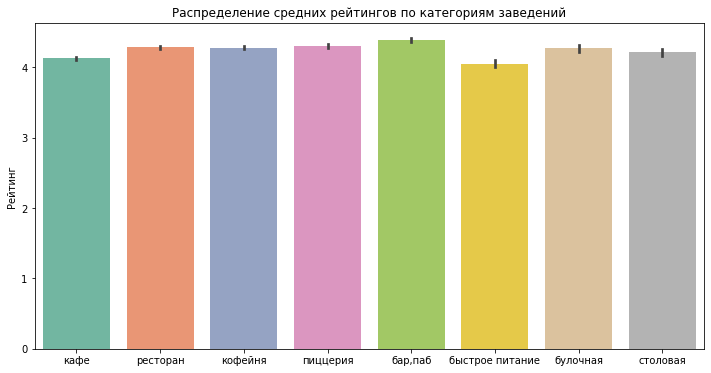

In [52]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='rating', data = data,
                 estimator = np.mean, orient='v')
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_ylabel('Рейтинг') 
ax.set_xlabel('')
plt.show()

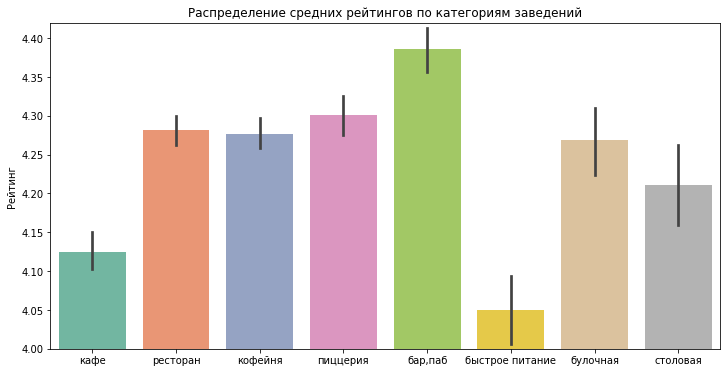

In [53]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='rating', data = data,
                 estimator = np.mean, orient='v')
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_ylabel('Рейтинг') 
ax.set_xlabel('')
plt.ylim(4, 4.42)
plt.show()

Усредненные рейтинги различаются несильно. Самые высокие рейтинги у баров(4.39), самые низкие рейтинги у ресторанов быстрого питания(4.05).

### Картограмма со средним рейтингом заведений каждого района

In [54]:
# средний рейтинг по районам
data.groupby ('district')['rating'].mean().reset_index().sort_values(by='rating', ascending = False)

,district,rating
5,Центральный административный округ,4.372248
2,Северный административный округ,4.238047
4,Северо-Западный административный округ,4.211057
8,Южный административный округ,4.184122
1,Западный административный округ,4.177566
0,Восточный административный округ,4.174340
7,Юго-Западный административный округ,4.171570
3,Северо-Восточный административный округ,4.150790
6,Юго-Восточный административный округ,4.100141


In [55]:
# загружаем карту Москвы
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаeм карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаeм хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_districts,
    data=data.groupby ('district')['rating'].mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

Самые высокие рейтинги у Центрального административного округа(4.38) и Северного административный округа(4.24), средние рейтинги у Северо-Западного административного округа(4.21), Южного административного округа(4.19),рейтинги остальных округов ниже 4.19, самый низкий рейтинг у Юго-Восточного административного округа(4.10).

### Отображение заведений на карте

In [56]:
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем пустой кластер
marker_cluster = MarkerCluster().add_to(m1)

# функция create_clusters, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)
m1

Больше всего заведений располагается в центре.

### Топ-15 улиц по количеству заведений

In [57]:
# построим сводную таблицу
street_category = data.pivot_table (
    index = 'street',
    columns = 'category',
    values = 'address',
    aggfunc = 'count'
)
street_category['total'] = street_category[['бар,паб', 'булочная', 'быстрое питание','кафе',
                                                'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
street_category = street_category.sort_values(by = 'total', ascending = False).head(15)
street_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект Мира,11.0,4.0,21.0,52.0,36.0,11.0,43.0,2.0,180.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,32.0,5.0,106.0
Ленинградский проспект,15.0,4.0,2.0,11.0,25.0,9.0,22.0,3.0,91.0
Дмитровское шоссе,5.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,87.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0,76.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,23.0,3.0,67.0


In [58]:
# удаляем столбец с общим количеством заведений по улицам
street_category = street_category.drop (columns = ['total'], axis = 1)

In [59]:
fig = px.bar(street_category, color = 'category', title = 'Категории заведений топ-15 улиц',
            orientation='h')
fig.update_layout(
    title_x = 0.5,
    xaxis_title="Количество заведений",
    yaxis_title="",
    margin=dict(l=0, r=0, t=30, b=0)
)
fig.show()

- проспект Мира лидирует по количеству заведений(183), самые большие категории кафе, рестораны и кофейни;
- практически на всех улицах лидируют кафе и рестораны;
- есть улицы на которых отсутствуют булочные (Каширское шоссе, Варшавское шоссе, МКАД, Люблинская улица, улица Миклухо-Маклая), чаще всего это шоссе;
- также есть улицы, на которых нет столовых (улица Вавилов, улица Миклухо-Маклая, Пятницкая улица);
- Ленинградский проспект и проспект Мира лидируют по количеству баров;
- проспект Мира лидер по количеству заведений быстрого питания, кафе и кофеен;
- Варшавское шоссе, Ленинградский проспект, Каширское шоссе лидируют по количеству столовых.

### Улицы, на которых находится только один объект общепита

In [60]:
# улицы, на которых находится только один объект общепита
street_count = data.groupby ('street')['name'].count().reset_index()
street_count.columns = ['street', 'count']
street_one = street_count[street_count['count']==1]['street'].tolist()
street_one

['1-й Автозаводский проезд',
 '1-й Балтийский переулок',
 '1-й Варшавский проезд',
 '1-й Вешняковский проезд',
 '1-й Голутвинский переулок',
 '1-й Грайвороновский проезд',
 '1-й Дербеневский переулок',
 '1-й Земельный переулок',
 '1-й Капотнинский проезд',
 '1-й Кирпичный переулок',
 '1-й Колобовский переулок',
 '1-й Котляковский переулок',
 '1-й Курьяновский проезд',
 '1-й Новокузнецкий переулок',
 '1-й Обыденский переулок',
 '1-й Рижский переулок',
 '1-й Самотёчный переулок',
 '1-й Сетуньский проезд',
 '1-й Спасоналивковский переулок',
 '1-й Щипковский переулок',
 '1-я Боевская улица',
 '1-я Курьяновская улица',
 '1-я Парковая улица',
 '1-я Стекольная улица',
 '1-я Фрунзенская улица',
 '1-я Ямская улица',
 '1-я линия Хорошёвского Серебряного Бора',
 '11-я Парковая улица',
 '12-я Парковая улица',
 '14-я Парковая улица',
 '16-я Парковая улица',
 '17-й проезд Марьиной Рощи',
 '2-й Балтийский переулок',
 '2-й Боткинский проезд',
 '2-й Верхний Михайловский проезд',
 '2-й Зачатьевский пере

In [61]:
one_place = data.query('street in @street_one')

In [62]:
m_one = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем пустой кластер
marker_cluster = MarkerCluster().add_to(m_one)

# применяем функцию create_clusters() к каждой строке датафрейма
one_place.apply(create_clusters, axis=1)
m_one

Только один объект общественного питания чаще всего находится на переулках, проездах и небольших улицах. Больше всего одиночных заведений в центре.

### Картограмма со средним чеком в заведениях различных районов

In [63]:
bill_district = (
    data.groupby('district')
    .agg({'middle_avg_bill': 'median'})
    .reset_index()
    .sort_values(by = 'middle_avg_bill', ascending = False)
)
bill_district

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,850.0
4,Северо-Западный административный округ,675.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,434.0


In [64]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаeм хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = moscow_districts,
    data = bill_district,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'Blues',
    fill_opacity = 0.8,
    legend_name = 'Средний чек в заведениях по районам',
).add_to(m2)
m2

- заведения с самыми высокими цеками находтся в Западном административном округe и Центральном административном округe, средний чек составляет 1000;
- далее идут Северо-Западный административный округ(700), Северный административный округ(650),Юго-Западный административный округ(600);
- дешевле все в Восточном административном округе(575),Северо-Восточном административном округе(500), Южном административном округе(500), Юго-Восточном административном округе(450);
- большее количество ресторанов и пабов в ЦАО, по сравнению с другими районами, может оказывать влияние на величину среднего чека.

**Выводы по разделу:**
- половину заведений общественного питания Москвы занимают кафе и рестораны, также популярны кофейни(16.8%). Самая низкая доля рынка у столовых(3.8%) и булочных(3.1%);
- сетевых заведений 38%, несетевых 62%;
- для булочных количество сетевых заведений преобладает над несетевыми. Примерно поровну сетевых и несетевых заведений в категориях пиццерия и кофейня. Для остальных категорий преобладает количество несетевых заведений, самый маленький процент у баров;
- составлен топ-15 популярных сетевых заведений Москвы. В топе преобладают кофейни,далее идут кафе, рестораны и пиццерии, одна сеть быстрого питания и булочная. В топе сетей отсутствуют бары и столовыe. Цены в заведениях в среднем ценовом диапазоне;
- больше всего заведений в Центральном административном округе(2241), меньше всего заведений в Северо-Западном административном округе(409), в остальных округах количество заведений находится в диапазоне от 709 до 898;
- усредненные рейтинги несильно различаются по категориям. Самые высокие рейтинги у баров(4.39), самые низкие рейтинги у ресторанов быстрого питания(4.05);
- самые высокие рейтинги у Центрального административного округа(4.38) и Северного административный округа(4.24), средние рейтинги у Северо-Западного административного округа(4.21), Южного административного округа(4.19),рейтинги остальных округов ниже 4.19, самый низкий рейтинг у Юго-Восточного административного округа(4.10);
- составлен топ-15 улиц по количеству заведений. Проспект Мира людирует по количеству заведений(183), самые большие категории кафе, рестораны и кофейни;
- только одно заведение общественного питания часто находится на небольших неоживленных улицах, переулках, проездах;
- самые высокие чеки в ЗАО и ЦАО, самые низкие в ЮАО и ЮВАО.

## Детализация исследования: открытие кофейни

### Распределение кофеен по районам

In [65]:
coffeshop = data[data['category'] == 'кофейня']
display(f'В датасете хранится информация о {coffeshop["name"].count()} кофейнях')

'В датасете хранится информация о 1412 кофейнях'

In [66]:
# посмотрим на количество кофейн по районам
coffeshop.groupby('district').agg(count = ('name', 'count')).reset_index().sort_values(by = 'count', ascending = False)

,district,count
5,Центральный административный округ,427
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [67]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# cоздадаем пустой кластер
marker_cluster = MarkerCluster().add_to(m3)

# применяем функцию create_clusters() к каждой строке датафрейма
coffeshop.apply(create_clusters, axis=1)
m3

- больше всего кофеен в Центральном административном округе(427), в два раза меньше кофеен в Северном административном округе(193), меньше всего кофеен в Северо-Западном административном округе(62);
- кофейни чаще всего располагаются вдоль оживленных улиц, в торговых центрах, общественных пространствах.

### Круглосуточные кофейни

In [68]:
# круглосуточные кофейни
coffeshop_24_7 = coffeshop[coffeshop["is_24_7"]==True]
display(f'Количество круглосуточных кофеен Москвы: {coffeshop_24_7["name"].count()},\
их доля от всех кофеен:{coffeshop_24_7["name"].count()/coffeshop["name"].count()} ')

'Количество круглосуточных кофеен Москвы: 58,их доля от всех кофеен:0.04107648725212465 '

In [69]:
# посмотрим на количество сетевых и несетевых круглосуточных кофеен
coffeshop_24_7_chain = coffeshop_24_7.groupby('chain').agg(count = ('name', 'count')).reset_index()
coffeshop_24_7_chain

,chain,count
0,0,9
1,1,49


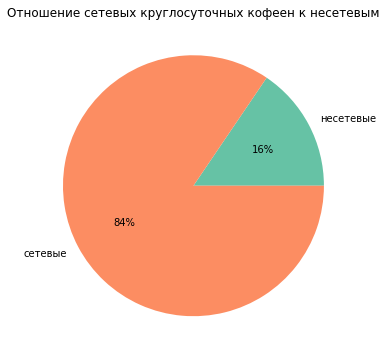

In [70]:
plt.figure(figsize = (6,6))
plt.pie(coffeshop_24_7_chain['count'], labels = ['несетевые', 'сетевые'], autopct='%.0f%%')
plt.title('Отношение сетевых круглосуточных кофеен к несетевым')
plt.show()

- только 4% от всего кофеен рабоют круглосуточно;
- 84% круглосуточных кофеен сетевые.

### Средние рейтинги кофеен по районам

In [71]:
coffeshop_rating = (
    coffeshop.groupby('district')
    .agg(rating = ('rating', 'mean'))
    .reset_index()
    .sort_values(by = 'rating', ascending = False)
)
coffeshop_rating

,district,rating
5,Центральный административный округ,4.336066
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [72]:
# создаем карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = moscow_districts,
    data = coffeshop.groupby ('district')['rating'].mean().reset_index(),
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'YlGnBu',
    fill_opacity = 0.6,
    legend_name = 'Средние рейтинги кофеен по районам',
).add_to(m4)
m4

- самые высокие рейтинги у Центрального административного округа(4.34), Северо-Западного административного округа(4.33) и Северного административного округа(4.29);
- далее идут Юго-Западный административный округ(4.28), Восточный административный округ(4.28);
- самые низкие рейтинги у Южного административного округа(4.23), Юго-Восточного административного округа(4.23), Северо-Восточного административного округа 4.22), Западного административного округа(4.20).

### Стоимость чашки капучино

In [73]:
coffeshop['middle_coffee_cup'].describe()

count    521.000000
mean     172.545106
std       65.816633
min       60.000000
25%      124.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Самая дешевая чашка капучино стоит 60 рублей, самая дорогая 375, медианное значение 170. Посмотрим на распределние стоимости чашки кофе по районам.

In [74]:
coffeshop.groupby ('district')['middle_coffee_cup'].mean().reset_index()\
         .sort_values(by='middle_coffee_cup', ascending = False)

,district,middle_coffee_cup
1,Западный административный округ,189.938776
5,Центральный административный округ,187.518519
7,Юго-Западный административный округ,184.176471
2,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
3,Северо-Восточный административный округ,165.333333
8,Южный административный округ,158.488372
6,Юго-Восточный административный округ,151.088235
0,Восточный административный округ,142.880952


In [75]:
coffeshop.query('middle_coffee_cup > 250').groupby('name')['address'].count()

name
atelier de tartelettes     1
bloom-n-brew               1
carrots and beans          1
coffee bean                2
coffee fm                  1
                          ..
кофейня на остоженке       1
па па кофе                 1
собрание                   1
циники                     1
шоколадница               55
Name: address, Length: 32, dtype: int64

In [76]:
# создаем карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = moscow_districts,
    data = coffeshop.groupby ('district')['middle_coffee_cup'].mean().reset_index(),
    columns = ['district', 'middle_coffee_cup'],
    key_on = 'feature.name',
    fill_color = 'RdPu',
    fill_opacity = 0.7,
    legend_name = 'Средняя стоимость чашки капучино по районам',
).add_to(m5)
m5

- самый дорогой кофе в Западном административном округе(190), Центральном административном округе(188), Юго-Западном административном округе(184);
- средняя стоимость в Северный административный округ(166), Северо-Западный административный округ(166), Северо-Восточный административный округ(165);
- самый дешевых кофе в Южном административном округе(158), Юго-Восточном административном округе(151), Восточном административном округе(143).

Если заказчики хотят полностью повторить концепцию кофейни из друзей, то такое заведение в Москве уже есть. В датасете написано, что это паб, но по факту это мультизаведение, в нем есть и кофе, и еда, и коктейльная карта.

In [77]:
data[data['name'] == 'френдс']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2669,френдс,"бар,паб","Москва, Краснобогатырская улица, 90, стр. 2",Восточный административный округ,"ежедневно, 08:00–23:00",55.801229,37.71016,4.5,средние,Средний счёт:400–700 ₽,550.0,NaN,0,52.0,Краснобогатырская улица,False


## Рекомендации по открытию нового заведения

- если открывать кофейню в стиле «Central Perk», то делать это лучше подальше от заведения френдс;
- запрос на открытие крутой, уютной и доступной кофейни,поэтому цены не должны быть высокими. Так как это локальная кофейня, а не бездушная сетевая, цены в ней не могут быть низкими, тем более необходимы немалые затраты на ремонт, поэтому рекомендую придерживаться средней ценовой политики, возможно чуть выше среднего; 
- в кофейне должны быть позиции с завтраками, ланчами и бранчами, потому что как показало исследование самое востребованная категория - это все таки кафе, значит в заведении должно быть что перекусить;
- наиболее перспективным для открытия кофейни выглядит Северо-Западный район, в этом районе не так много кофеен и не такая большая конкуренция, при этом средние цены подходят под ценовую политику.